In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### 설치 & model import

In [ ]:
!pip3 install torch
!pip3 install torchvision
!pip3 install pytorch-lightning

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 798 kB 7.1 MB/s 
     |████████████████████████████████| 512 kB 63.6 MB/s 
     |████████████████████████████████| 125 kB 75.7 MB/s 
     |████████████████████████████████| 87 kB 8.2 MB/s 
  Created wheel for fire: filename=fire-0.4.0-py2.py3-none-any.whl size=115943 sha256=f2e09b057778911117daaaf5bb030b5f57d0ef2d09c85acedcae31fcd1b9196f
  Stored in directory: /root/.cache/pip/wheels/1f/10/06/2a990ee4d73a8479fe2922445e8a876d38cfbfed052284c6a1
Successfully built fire


In [ ]:
!pip install pytorch_forecasting

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 141 kB 6.8 MB/s 
     |████████████████████████████████| 308 kB 53.5 MB/s 
     |████████████████████████████████| 33.8 MB 266 kB/s 
     |████████████████████████████████| 81 kB 355 kB/s 
     |████████████████████████████████| 209 kB 73.8 MB/s 
     |████████████████████████████████| 78 kB 8.9 MB/s 
     |████████████████████████████████| 50 kB 6.6 MB/s 
     |████████████████████████████████| 147 kB 53.5 MB/s 
     |████████████████████████████████| 112 kB 62.5 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11136 sha256=77371c3f957a91b9585eefb2e94188d43564ce3e8eaa0434514737fae0943c85
  Stored in directory: /root/.cache/pip/wheels/7f/1a/65/84ff8c386bec21fca6d220ea1f5498a0367883a78dd5ba6122
Successfully built pyperclip
  Attempting uninstall: scipy
    Found existing installation: scipy 1.7.3
    Uninstalling sc

In [ ]:
import numpy as np
import pandas as pd
import pytorch_lightning as pl
from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor
from pytorch_lightning.loggers import TensorBoardLogger
import torch
import os

In [ ]:
from pytorch_forecasting import Baseline, TemporalFusionTransformer, TimeSeriesDataSet
from pytorch_forecasting.data import GroupNormalizer
from pytorch_forecasting.metrics import SMAPE, PoissonLoss, QuantileLoss, RMSE
#from pytorch_forecasting.models.temporal_fusion_transformer.tuning import optimize_hyperparameters

In [ ]:
from pytorch_forecasting.metrics import MultiHorizonMetric
from typing import Any, Callable, Dict, List, Optional, Tuple, Union

class TweedieLoss(MultiHorizonMetric):
    """
    Tweedie loss.

    Tweedie regression with log-link. It might be useful, e.g., for modeling total
    loss in insurance, or for any target that might be tweedie-distributed.

    The loss will take the exponential of the network output before it is returned as prediction.
    Target normalizer should therefore have no "reverse" transformation, e.g.
    for the :py:class:`~data.timeseries.TimeSeriesDataSet` initialization, one could use:

    .. code-block:: python

        from pytorch_forecasting import TimeSeriesDataSet, EncoderNormalizer

        dataset = TimeSeriesDataSet(
            target_normalizer=EncoderNormalizer(transformation=dict(forward=torch.log1p))
        )

    Note that in this example, the data is log1p-transformed before normalized but not re-transformed.
    The TweedieLoss applies this "exp"-re-transformation on the network output after it has been de-normalized.
    The result is the model prediction.
    """

    def __init__(self, reduction="mean", p: float = 1.5, **kwargs):
        """
        Args:
            p (float, optional): tweedie variance power which is greater equal
                1.0 and smaller 2.0. Close to ``2`` shifts to
                Gamma distribution and close to ``1`` shifts to Poisson distribution.
                Defaults to 1.5.
            reduction (str, optional): How to reduce the loss. Defaults to "mean".
        """
        super().__init__(reduction=reduction, **kwargs)
        assert 1 <= p < 2, "p must be in range [1, 2]"
        self.p = p

    def to_prediction(self, out: Dict[str, torch.Tensor]):
        rate = torch.exp(super().to_prediction(out))
        return rate


    def loss(self, y_pred, y_true):
        y_pred = super().to_prediction(y_pred)
        a = y_true * torch.exp(y_pred * (1 - self.p)) / (1 - self.p)
        b = torch.exp(y_pred * (2 - self.p)) / (2 - self.p)
        loss = -a + b
        return loss


### Load data

In [ ]:
#os.chdir("/content/drive/MyDrive/소캡디/code")
os.chdir("/content/drive/MyDrive/4-1/소캡디/code")

In [ ]:
data = pd.read_pickle("./data_use/CA_1_final_grid_df.pkl")

In [ ]:
data.isnull().sum()

id                       0
item_id                  0
dept_id                  0
cat_id                   0
store_id                 0
state_id                 0
d                        0
sales                85372
release                  0
sell_price               0
price_max                0
price_min                0
price_std                0
price_mean               0
price_norm               0
price_nunique            0
item_nunique             0
price_momentum           0
price_momentum_m         0
price_momentum_y         0
event_name_1             0
event_type_1             0
event_name_2             0
event_type_2             0
snap_CA                  0
snap_TX                  0
snap_WI                  0
tm_d                     0
tm_w                     0
tm_m                     0
tm_y                     0
tm_wm                    0
tm_dw                    0
tm_w_end                 0
rolling_mean_7      103666
rolling_std_7       103666
rolling_mean_14     125009
r

### 데이터 추가정제

In [ ]:
data.dropna(subset=['sales'],inplace=True) #test data 삭제
data = data.reset_index(drop=True)

data = data.drop(columns = ['id','store_id','state_id'])

values = {"rolling_mean_7": 0, "rolling_mean_14": 0, "rolling_mean_30": 0, "rolling_mean_60":0, "rolling_mean_180":0,
          "rolling_std_7":0,"rolling_std_14":0, "rolling_std_30":0, "rolling_std_60":0,"rolling_std_180":0}
data.fillna(values, inplace=True)

In [ ]:
data["log_sales"] = np.log(data.sales + 0.000001)

"""
data["rolling_mean_7"] = np.log(data.rolling_mean_7+1)
data["rolling_mean_14"] = np.log(data.rolling_mean_14+1)
data["rolling_mean_30"] = np.log(data.rolling_mean_30+1)
data["rolling_mean_60"] = np.log(data.rolling_mean_60+1)
data["rolling_mean_180"] = np.log(data.rolling_mean_180+1)
data["rolling_std_7"] = np.log(data.rolling_std_7+1)
data["rolling_std_14"] = np.log(data.rolling_std_14+1)
data["rolling_std_30"] = np.log(data.rolling_std_30+1)
data["rolling_std_60"] = np.log(data.rolling_std_60+1)
data["rolling_std_180"] = np.log(data.rolling_std_180+1)
data["enc_cat_id_mean"] = np.log(data.enc_cat_id_mean+1)
data["enc_dept_id_mean"] = np.log(data.enc_dept_id_mean+1)
data["enc_item_id_mean"] = np.log(data.enc_item_id_mean+1)
data["enc_cat_id_std"] = np.log(data.enc_cat_id_std+1)
data["enc_dept_id_std"] = np.log(data.enc_dept_id_std+1)
data["enc_item_id_std"] = np.log(data.enc_item_id_std+1)
"""

'\ndata["rolling_mean_7"] = np.log(data.rolling_mean_7+1)\ndata["rolling_mean_14"] = np.log(data.rolling_mean_14+1)\ndata["rolling_mean_30"] = np.log(data.rolling_mean_30+1)\ndata["rolling_mean_60"] = np.log(data.rolling_mean_60+1)\ndata["rolling_mean_180"] = np.log(data.rolling_mean_180+1)\ndata["rolling_std_7"] = np.log(data.rolling_std_7+1)\ndata["rolling_std_14"] = np.log(data.rolling_std_14+1)\ndata["rolling_std_30"] = np.log(data.rolling_std_30+1)\ndata["rolling_std_60"] = np.log(data.rolling_std_60+1)\ndata["rolling_std_180"] = np.log(data.rolling_std_180+1)\ndata["enc_cat_id_mean"] = np.log(data.enc_cat_id_mean+1)\ndata["enc_dept_id_mean"] = np.log(data.enc_dept_id_mean+1)\ndata["enc_item_id_mean"] = np.log(data.enc_item_id_mean+1)\ndata["enc_cat_id_std"] = np.log(data.enc_cat_id_std+1)\ndata["enc_dept_id_std"] = np.log(data.enc_dept_id_std+1)\ndata["enc_item_id_std"] = np.log(data.enc_item_id_std+1)\n'

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4788267 entries, 0 to 4788266
Data columns (total 48 columns):
 #   Column            Dtype   
---  ------            -----   
 0   item_id           category
 1   dept_id           category
 2   cat_id            category
 3   d                 int16   
 4   sales             float64 
 5   release           int16   
 6   sell_price        float16 
 7   price_max         float16 
 8   price_min         float16 
 9   price_std         float16 
 10  price_mean        float16 
 11  price_norm        float16 
 12  price_nunique     int8    
 13  item_nunique      int16   
 14  price_momentum    float16 
 15  price_momentum_m  float16 
 16  price_momentum_y  float16 
 17  event_name_1      category
 18  event_type_1      category
 19  event_name_2      category
 20  event_type_2      category
 21  snap_CA           category
 22  snap_TX           category
 23  snap_WI           category
 24  tm_d              int8    
 25  tm_w              

### df를 인코더 형식으로 변환

In [ ]:
max_prediction_length = 28  # maximum prediction/decoder length (choose this not too short as it can help convergence) 
max_encoder_length = 90 # maximum length to encode. This is the maximum history length used by the time series dataset. #1년은 ram용량 없어짐 -> 로컬환경 구축
training_cutoff = data["d"].max() - max_prediction_length #training set에 사용할 time만큼

training = TimeSeriesDataSet(
    data[lambda x: x["d"] <= training_cutoff],
    time_idx="d",
    target="sales",
    group_ids=["item_id"],
    min_encoder_length= 1,
    max_encoder_length= max_encoder_length,
    min_prediction_length= 1,
    max_prediction_length=max_prediction_length,
    static_categoricals=["item_id","dept_id","cat_id"], #시간이 지나도 변하지 않는 categorical
    static_reals=["release","price_max","price_min","price_std","price_mean","price_nunique",  "enc_cat_id_mean", "enc_cat_id_std", "enc_dept_id_mean", "enc_dept_id_std",
                  "enc_item_id_mean", "enc_item_id_std"], # 시간이 지나도 변하지 않는 continuous variables
    # list of categorical variables that change over time and are known in the future
    time_varying_known_categoricals=["snap_CA", "snap_TX","snap_WI","tm_w_end","event_name_1","event_name_2","event_type_1","event_type_2"], 
    # list of continuous variables that change over time and are known in the future
    time_varying_known_reals=["d","tm_d","tm_w",'tm_m',"tm_y","tm_wm","tm_dw","sell_price","price_norm","price_momentum","price_momentum_m","price_momentum_y",
                              "rolling_mean_7", "rolling_mean_14", "rolling_mean_30", "rolling_mean_60", "rolling_mean_180",
                              "rolling_std_7","rolling_std_14", "rolling_std_30", "rolling_std_60","rolling_std_180"],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=["sales","log_sales"],
#    target_normalizer=GroupNormalizer(
#        groups=["item_id"], transformation="softplus"
#    ),  # use softplus and normalize by group
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
)


In [ ]:
validation = TimeSeriesDataSet.from_dataset(training, data, predict=True, stop_randomization=True)

In [ ]:
batch_size = 128  
"""
train_dataloader = training.to_dataloader(train=True,batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=0)
"""
#train_dataloader = training.to_dataloader(train=True,batch_size=batch_size, num_workers=4)
#val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=4)

train_dataloader = training.to_dataloader(train=True,batch_size=batch_size, num_workers=1)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=1)

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


### 모델 빌드

In [ ]:
early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=False, mode="min")
lr_logger = LearningRateMonitor()  # log the learning rate
logger = TensorBoardLogger("lightning_logs_ver4")  # logging results to a tensorboard

trainer = pl.Trainer(
    max_epochs=50,
    gpus=1,
    enable_model_summary=True,
    gradient_clip_val=0.1,
    limit_train_batches=30,  # coment in for training, running valiation every 30 batches
    # fast_dev_run=True,  # comment in to check that networkor dataset has no serious bugs
    callbacks=[lr_logger,early_stop_callback],
    logger=logger,
)

/usr/local/lib/python3.8/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:446: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [ ]:
tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.0845,
    hidden_size=20, 
    attention_head_size=1,
    dropout=0.265,
    hidden_continuous_size=10,
    output_size=1,  # point로 바꿔서 1로 변경
    loss= TweedieLoss(),
    log_interval=10,  # uncomment for learning rate finder and otherwise, e.g. to 10 for logging every 10 batches
    reduce_on_plateau_patience=4,
)

/usr/local/lib/python3.8/dist-packages/pytorch_lightning/utilities/parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
/usr/local/lib/python3.8/dist-packages/pytorch_lightning/utilities/parsing.py:262: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
  rank_zero_warn(


In [ ]:
import tensorflow as tf
import tensorboard as tb
tf.io.gfile = tb.compat.tensorflow_stub.io.gfile

In [ ]:
import gc
gc.collect()
torch.cuda.empty_cache()

In [ ]:
trainer.fit(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | TweedieLoss                     | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 61.4 K
3  | prescalers                         | ModuleDict                      | 800   
4  | static_variable_selection          | VariableSelectionNetwork        | 16.2 K
5  | encoder_variable_selection         | VariableSelectionNetwork        | 27.9 K
6  | decoder_variable_selection         | VariableSelectionNetwork        | 25.8 K
7  | static_context_variable_selection  | GatedResidualNetwork            | 1.7 K 
8  | static_context_initial_hidde

Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/pytorch_lightning/trainer/trainer.py:1558: PossibleUserWarning: The number of training batches (30) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

In [ ]:
best_model_path = trainer.checkpoint_callback.best_model_path
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)

/usr/local/lib/python3.8/dist-packages/pytorch_lightning/utilities/parsing.py:262: UserWarning: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
  rank_zero_warn(
/usr/local/lib/python3.8/dist-packages/pytorch_lightning/utilities/parsing.py:262: UserWarning: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.
  rank_zero_warn(


In [ ]:
actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
predictions = best_tft.predict(val_dataloader)
(actuals - predictions).abs().mean()

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


tensor(1.1605)

In [ ]:
raw_predictions, x = best_tft.predict(val_dataloader, mode="raw", return_x=True)

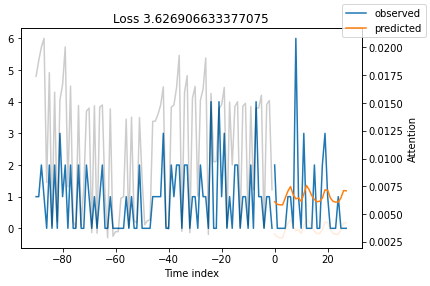

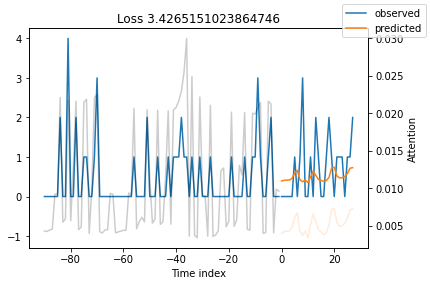

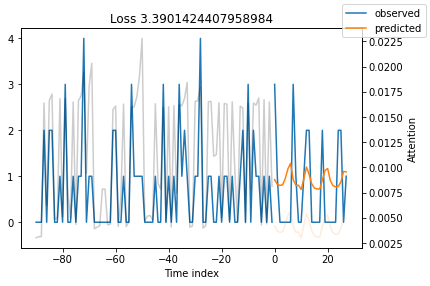

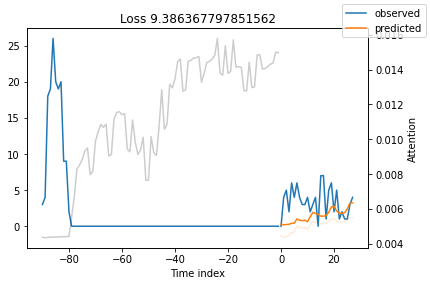

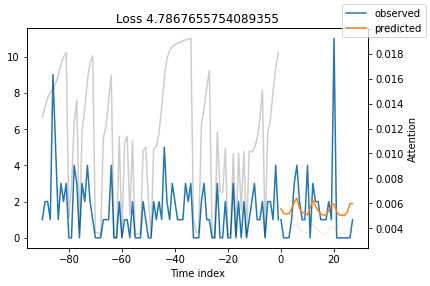

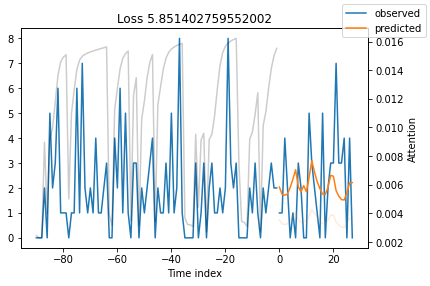

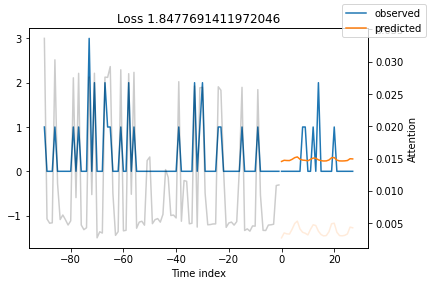

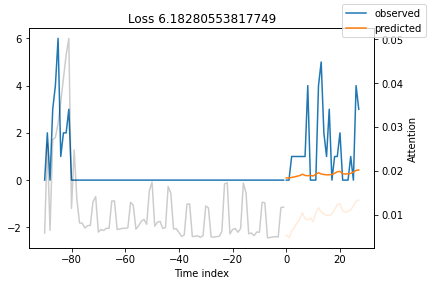

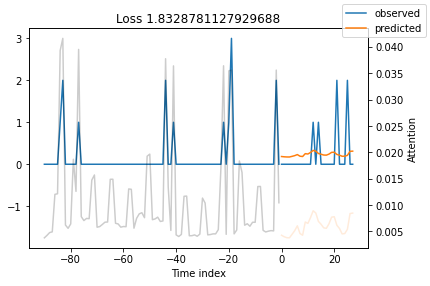

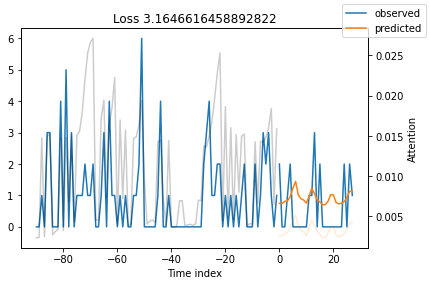

In [ ]:
for idx in range(10):  # plot 10 examples
    best_tft.plot_prediction(x, raw_predictions, idx=idx, add_loss_to_title=True);

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:563: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.8/dist-packages/pytorch_forecasting/models/base_model.py:1699: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  log_scale = scipy.stats.skew(values_actual) > 1.6
/usr/local/lib/python3.8/dist-packages/pytorch_forecasting/models/base_model.py:1699: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearl

{'release': <Figure size 720x360 with 2 Axes>,
 'price_max': <Figure size 720x360 with 2 Axes>,
 'price_min': <Figure size 720x360 with 2 Axes>,
 'price_std': <Figure size 720x360 with 2 Axes>,
 'price_mean': <Figure size 720x360 with 2 Axes>,
 'price_nunique': <Figure size 720x360 with 2 Axes>,
 'enc_cat_id_mean': <Figure size 720x360 with 2 Axes>,
 'enc_cat_id_std': <Figure size 720x360 with 2 Axes>,
 'enc_dept_id_mean': <Figure size 720x360 with 2 Axes>,
 'enc_dept_id_std': <Figure size 720x360 with 2 Axes>,
 'enc_item_id_mean': <Figure size 720x360 with 2 Axes>,
 'enc_item_id_std': <Figure size 720x360 with 2 Axes>,
 'encoder_length': <Figure size 720x360 with 2 Axes>,
 'sales_center': <Figure size 720x360 with 2 Axes>,
 'sales_scale': <Figure size 720x360 with 2 Axes>,
 'd': <Figure size 720x360 with 2 Axes>,
 'tm_d': <Figure size 720x360 with 2 Axes>,
 'tm_w': <Figure size 720x360 with 2 Axes>,
 'tm_m': <Figure size 720x360 with 2 Axes>,
 'tm_y': <Figure size 720x360 with 2 Axes>

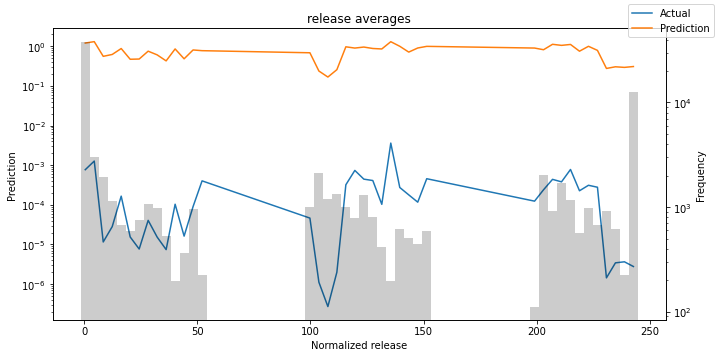

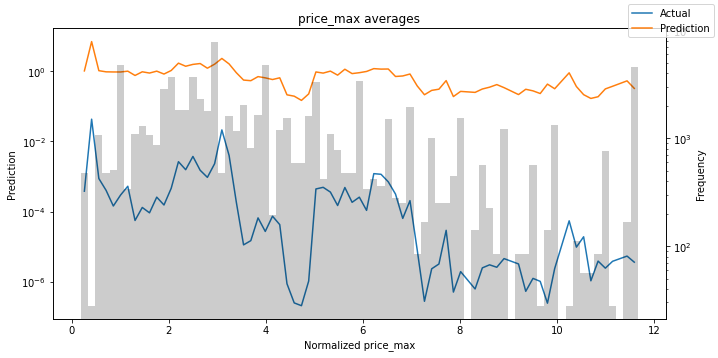

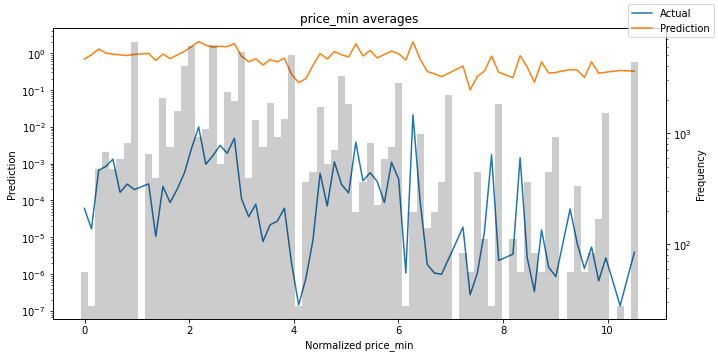

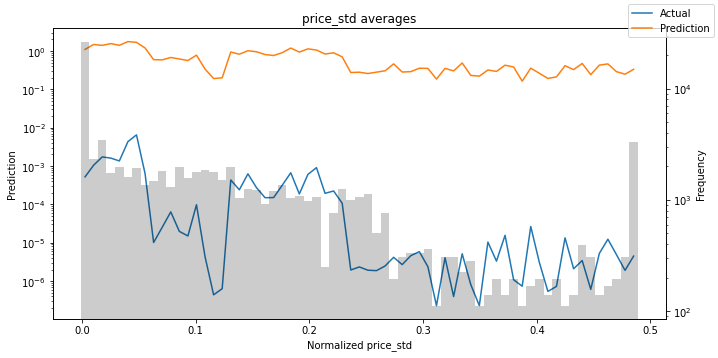

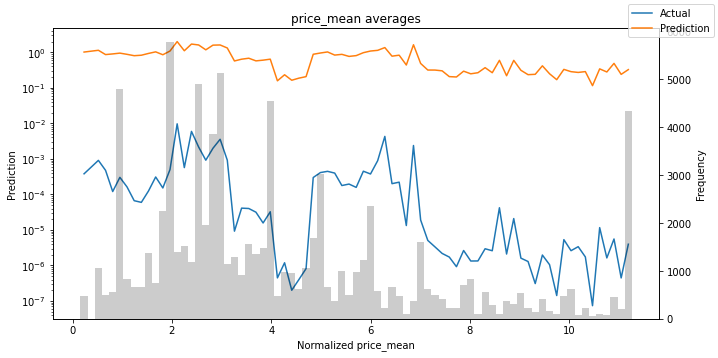

...

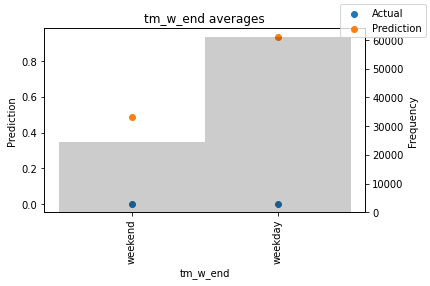

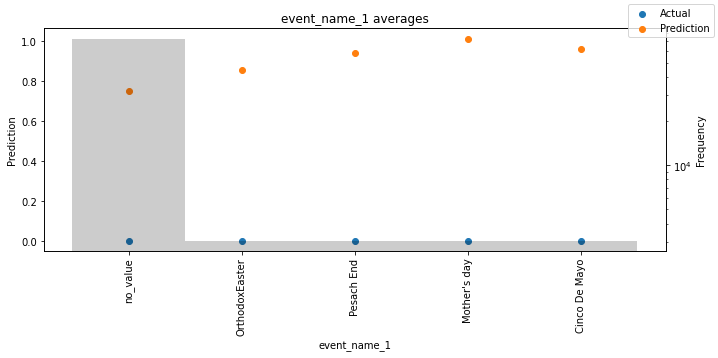

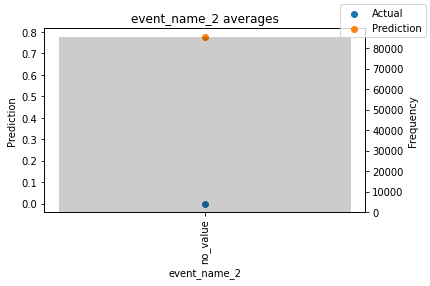

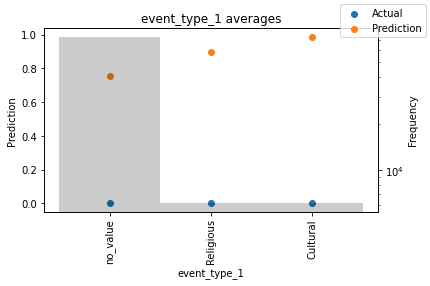

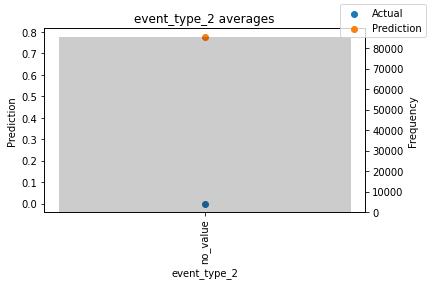

In [ ]:
predictions, x = best_tft.predict(val_dataloader, return_x=True)
predictions_vs_actuals = best_tft.calculate_prediction_actual_by_variable(x, predictions)
best_tft.plot_prediction_actual_by_variable(predictions_vs_actuals)

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir lightning_logs_ver4/

<IPython.core.display.Javascript object>

### 모델 저장 & 로드

In [ ]:
torch.save(best_tft.state_dict(),'./model_build/tft_best_model_1207_store.pt')

In [ ]:
loaded_model = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.001,
    hidden_size=160, #state size가 이거일까...?
    attention_head_size=4,
    dropout=0.1,
    hidden_continuous_size=80,
    output_size=7,  # point로 바꿔서 1로 변경
    loss= QuantileLoss(),
    log_interval=10,  # uncomment for learning rate finder and otherwise, e.g. to 10 for logging every 10 batches
    reduce_on_plateau_patience=4,
)
loaded_model.load_state_dict(torch.load('./model_build/tft_best_model_1129.pt'))
loaded_model.eval()

/usr/local/lib/python3.7/dist-packages/torchmetrics/utilities/prints.py:36: UserWarning: Torchmetrics v0.9 introduced a new argument class property called `full_state_update` that has
                not been set for this class (QuantileLoss). The property determines if `update` by
                default needs access to the full metric state. If this is not the case, significant speedups can be
                achieved and we recommend setting this to `False`.
                We provide an checking function
                `from torchmetrics.utilities import check_forward_full_state_property`
                that can be used to check if the `full_state_update=True` (old and potential slower behaviour,
                default for now) or if `full_state_update=False` can be used safely.
                
  warnings.warn(*args, **kwargs)
/usr/local/lib/python3.7/dist-packages/torchmetrics/utilities/prints.py:36: UserWarning: Torchmetrics v0.9 introduced a new argument class property calle

TemporalFusionTransformer(
  (loss): QuantileLoss()
  (logging_metrics): ModuleList(
    (0): SMAPE()
    (1): MAE()
    (2): RMSE()
    (3): MAPE()
  )
  (input_embeddings): MultiEmbedding(
    (embeddings): ModuleDict(
      (item_id): Embedding(3049, 100)
      (dept_id): Embedding(7, 5)
      (cat_id): Embedding(3, 3)
      (snap_CA): Embedding(2, 1)
      (snap_TX): Embedding(2, 1)
      (snap_WI): Embedding(2, 1)
      (tm_w_end): Embedding(2, 1)
      (event_name_1): Embedding(31, 11)
      (event_name_2): Embedding(5, 4)
      (event_type_1): Embedding(5, 4)
      (event_type_2): Embedding(3, 3)
    )
  )
  (prescalers): ModuleDict(
    (release): Linear(in_features=1, out_features=80, bias=True)
    (price_max): Linear(in_features=1, out_features=80, bias=True)
    (price_min): Linear(in_features=1, out_features=80, bias=True)
    (price_std): Linear(in_features=1, out_features=80, bias=True)
    (price_mean): Linear(in_features=1, out_features=80, bias=True)
    (price_nuniqu

In [ ]:
actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
predictions = loaded_model.predict(val_dataloader)
(actuals - predictions).abs().mean()

tensor(0.3791)

In [ ]:
raw_predictions, x = loaded_model.predict(val_dataloader, mode="raw", return_x=True)

In [ ]:
for idx in range(10):  # plot 10 examples
    loaded_model.plot_prediction(x, raw_predictions, idx=idx, add_loss_to_title=True);